<a href="https://colab.research.google.com/github/Gaurav55ks/Encryptix/blob/main/Generating_Word_using_RNN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!sudo apt-get update
!sudo apt-get install tesseract-ocr
!pip install pytesseract

Get:1 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease [3,626 B]
Hit:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease
Get:3 http://security.ubuntu.com/ubuntu jammy-security InRelease [129 kB]
Hit:4 http://archive.ubuntu.com/ubuntu jammy InRelease
Ign:5 https://r2u.stat.illinois.edu/ubuntu jammy InRelease
Get:6 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [128 kB]
Get:7 https://r2u.stat.illinois.edu/ubuntu jammy Release [5,713 B]
Get:8 https://r2u.stat.illinois.edu/ubuntu jammy Release.gpg [793 B]
Hit:9 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Get:10 https://r2u.stat.illinois.edu/ubuntu jammy/main amd64 Packages [2,544 kB]
Hit:11 http://archive.ubuntu.com/ubuntu jammy-backports InRelease
Get:12 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease [24.3 kB]
Get:13 http://archive.ubuntu.com/ubuntu jammy-updates/main amd64 Packages [2,263 kB]
Hit:14 https://ppa.launc

In [2]:
# Importing Libraries
import os
import random
from pathlib import Path
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from tqdm.auto import tqdm
from timeit import default_timer as timer
import cv2
import pytesseract
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
from torch.utils.data import DataLoader,random_split
from torchvision import transforms, datasets

In [3]:
from google.colab import files
files.upload()
!kaggle datasets download -d naderabdalghani/iam-handwritten-forms-dataset
!unzip iam-handwritten-forms-dataset.zip -d iam-handwritten-forms-dataset

Saving kaggle.json to kaggle.json
Dataset URL: https://www.kaggle.com/datasets/naderabdalghani/iam-handwritten-forms-dataset
License(s): unknown
100% 4.30G/4.31G [00:57<00:00, 116MB/s]
100% 4.31G/4.31G [00:57<00:00, 80.0MB/s]
Archive:  iam-handwritten-forms-dataset.zip
  inflating: iam-handwritten-forms-dataset/__notebook_source__.ipynb  
  inflating: iam-handwritten-forms-dataset/data/000/a01-000u.png  
  inflating: iam-handwritten-forms-dataset/data/000/a01-003u.png  
  inflating: iam-handwritten-forms-dataset/data/000/a01-007u.png  
  inflating: iam-handwritten-forms-dataset/data/000/a01-011u.png  
  inflating: iam-handwritten-forms-dataset/data/000/a01-014u.png  
  inflating: iam-handwritten-forms-dataset/data/000/a01-020u.png  
  inflating: iam-handwritten-forms-dataset/data/000/a01-026u.png  
  inflating: iam-handwritten-forms-dataset/data/000/a01-030u.png  
  inflating: iam-handwritten-forms-dataset/data/000/a01-043u.png  
  inflating: iam-handwritten-forms-dataset/data/000/a01-

In [4]:
## Function to go through the files.
def walk_through_dir(dir_path):
  for dirpath, dirnames, filenames in os.walk(dir_path):
    print(f"There are {len(dirnames)} directories and {len(filenames)} images in '{dirpath}'.")

In [5]:
walk_through_dir("/content/iam-handwritten-forms-dataset")

There are 1 directories and 1 images in '/content/iam-handwritten-forms-dataset'.
There are 657 directories and 0 images in '/content/iam-handwritten-forms-dataset/data'.
There are 0 directories and 1 images in '/content/iam-handwritten-forms-dataset/data/575'.
There are 0 directories and 1 images in '/content/iam-handwritten-forms-dataset/data/196'.
There are 0 directories and 5 images in '/content/iam-handwritten-forms-dataset/data/293'.
There are 0 directories and 1 images in '/content/iam-handwritten-forms-dataset/data/319'.
There are 0 directories and 1 images in '/content/iam-handwritten-forms-dataset/data/183'.
There are 0 directories and 1 images in '/content/iam-handwritten-forms-dataset/data/525'.
There are 0 directories and 9 images in '/content/iam-handwritten-forms-dataset/data/333'.
There are 0 directories and 3 images in '/content/iam-handwritten-forms-dataset/data/212'.
There are 0 directories and 2 images in '/content/iam-handwritten-forms-dataset/data/295'.
There are 

In [6]:
device = "cuda" if torch.cuda.is_available() else "cpu"
device

'cuda'

In [7]:
path = Path("/content/iam-handwritten-forms-dataset")
data_path = path/"data"

Random Image Path : /content/iam-handwritten-forms-dataset/data/000/a05-121.png
Image Class : 000
Image Height : 3542
Image Width : 2479


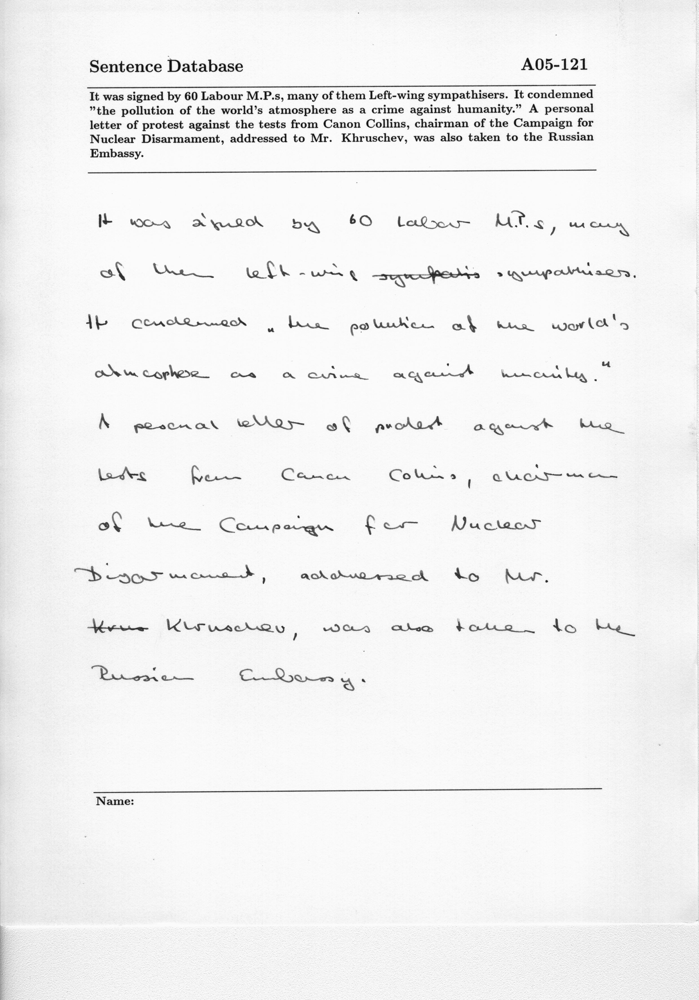

In [8]:
image_path_list = list(data_path.glob("*/*"))
random_image_path = random.choice(image_path_list)

image_class = random_image_path.parent.stem

img = Image.open(random_image_path)

print(f"Random Image Path : {random_image_path}")
print(f"Image Class : {image_class}")
print(f"Image Height : {img.height}")
print(f"Image Width : {img.width}")
img

In [9]:
image_transforms = transforms.Compose([
    transforms.Grayscale(num_output_channels = 1),
    transforms.Resize((128,128)),
    transforms.ToTensor(),
    transforms.Normalize((0.5,),(0.5,))
])
image_transforms

Compose(
    Grayscale(num_output_channels=1)
    Resize(size=(128, 128), interpolation=bilinear, max_size=None, antialias=True)
    ToTensor()
    Normalize(mean=(0.5,), std=(0.5,))
)

In [10]:
def plot_transformed_image(image_paths,transform,n=3,seed=42):
    random.seed(seed)
    random_image_paths = random.sample(image_paths,k=n)
    for image_path in random_image_paths:
        with Image.open(image_path) as f:
            fig,ax = plt.subplots(1,2)
            ax[0].imshow(f)
            ax[0].set_title(f"Original Size : {f.size}")
            ax[0].axis(False)
            transformed_image = transform(f).permute(1,2,0)
            ax[1].imshow(transformed_image)
            ax[1].set_title(f"Transformed \nsize : {transformed_image.shape}")
            ax[1].axis(False)

            fig.suptitle(f"Class : {image_path.parent.stem}",fontsize = 16)

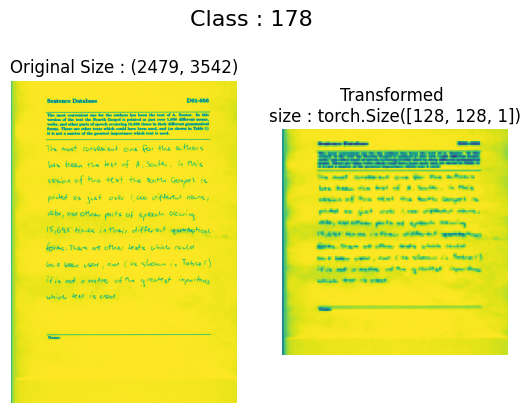

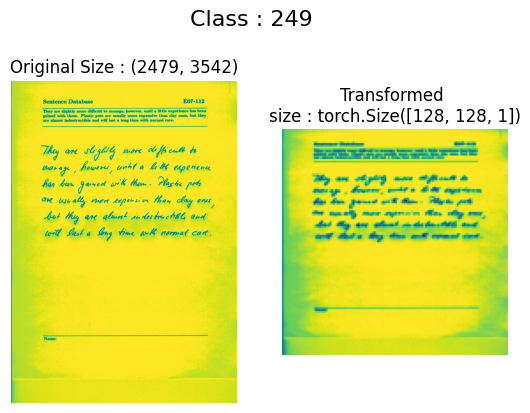

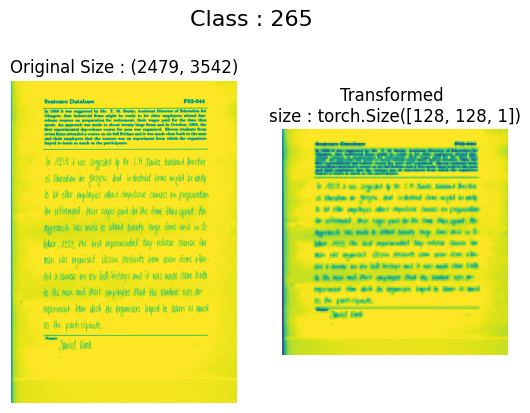

In [11]:
plot_transformed_image(image_path_list,image_transforms)

In [12]:
train_data = datasets.ImageFolder(root = data_path,
                                 transform = image_transforms,
                                 target_transform = None)
train_data

Dataset ImageFolder
    Number of datapoints: 1539
    Root location: /content/iam-handwritten-forms-dataset/data
    StandardTransform
Transform: Compose(
               Grayscale(num_output_channels=1)
               Resize(size=(128, 128), interpolation=bilinear, max_size=None, antialias=True)
               ToTensor()
               Normalize(mean=(0.5,), std=(0.5,))
           )

In [13]:
## Splitting Data for Faster Experiment.
"""subset_size = 250
dataset_size = len(train_data)

if subset_size > dataset_size:
    subset_size = dataset_size

# Split the dataset into subset and remaining
subset, _ = random_split(train_data, [subset_size, dataset_size - subset_size])
"""

'subset_size = 250\ndataset_size = len(train_data)\n\nif subset_size > dataset_size:\n    subset_size = dataset_size\n\n# Split the dataset into subset and remaining\nsubset, _ = random_split(train_data, [subset_size, dataset_size - subset_size])\n'

In [14]:
val_size = int(0.2 * len(train_data))  # 20% of the data for validation
train_size = len(train_data) - val_size

train_subset, val_subset = random_split(train_data, [train_size, val_size])

In [15]:
len(train_subset) , len(val_subset)

(1232, 307)

In [16]:
## Creating DataLoaders
train_dataloader = DataLoader(dataset = train_subset,
                             batch_size = 32,
                             shuffle=True,
                             num_workers = os.cpu_count())
val_dataloader = DataLoader(dataset = val_subset,
                           batch_size = 32,
                           shuffle = False,
                           num_workers = os.cpu_count())

train_dataloader , val_dataloader

(<torch.utils.data.dataloader.DataLoader at 0x7bd699491d20>,
 <torch.utils.data.dataloader.DataLoader at 0x7bd699493d00>)

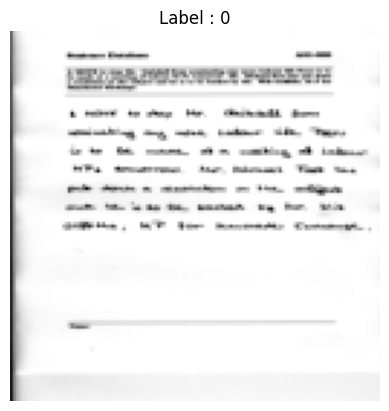

In [17]:
image,label = train_data[0]
plt.imshow(transforms.ToPILImage()(image),cmap="gray")
plt.title(f"Label : {label}")
plt.axis(False)
plt.show()

In [18]:
## Creating Preprocess_image to improve image quality before extracting text
def preprocess_image(image):
    if image.mode != 'RGB':
        image = image.convert('RGB')

    image_array = np.array(image)

    gray_image = cv2.cvtColor(image_array,cv2.COLOR_RGB2GRAY)

    _,thresh_image = cv2.threshold(gray_image,0,255,cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    return thresh_image

def extract_text_from_image(image):
    preprocessed_image = preprocess_image(image)
    pil_image = Image.fromarray(preprocessed_image)
    text = pytesseract.image_to_string(pil_image,config='--psm 11')
    return text.strip()

In [40]:
image_path_list = list(data_path.glob("*/*"))
random_image_path = random.choice(image_path_list)
image = Image.open(random_image_path)

extracted_text = extract_text_from_image(image)
print(f"Extracted Image : {extracted_text}")

Extracted Image : Sentence Database

B01-084

That was the first point that Mr. Hammarskjold made. India has responded hand-

somely by providing 3,000 men, who must take about a fortnight to arrive. If the UN

forces were thick enough on the ground, such incidents as that at Matadi would not

happen. THE UN’s ability to keep peace depends simply on adequate support by the

nations which have set their hands to this plough.

4

That aes Ue funt puck tat ube. Homma slejalel

woele. eli loo reaprrclad Warrelmruely Ay povteling

oud, juctdeub ay Hot ob Hote Li word vet

Lepper. The UM's ctibtly be kap peace olaprcls

Oruply on acdagrate supyert fy te vations

ANA, owe vet fetr hornd, & lia Perel.

Name:


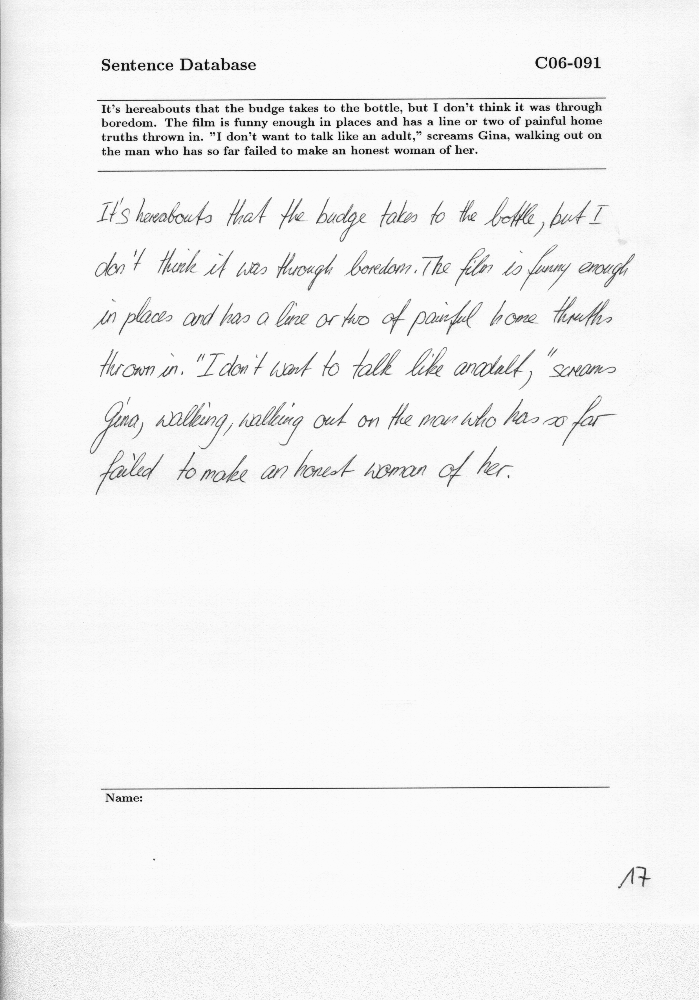

In [20]:
image

In [21]:
## HandWritingRNN class
class HandWritingRNN(nn.Module):
    def __init__(self,
                input_shape : int,
                hidden_units : int,
                output_shape : int,
                num_layers : int = 1):
        super(HandWritingRNN,self).__init__()
        self.hidden_units = hidden_units
        self.num_layers = num_layers
        self.RNN = nn.LSTM(input_shape,
                          hidden_units,
                          num_layers,
                          batch_first = True)
        self.FC = nn.Linear(hidden_units,
                           output_shape)
    def forward(self,x,hidden):
        out,hidden = self.RNN(x,hidden)
        out = self.FC(out)
        return out,hidden

    def init_hidden(self,batch_size,device):
        return (torch.zeros(self.num_layers,batch_size,self.hidden_units,device = device),
               torch.zeros(self.num_layers,batch_size,self.hidden_units,device = device))

In [22]:
def train_step(model :torch.nn.Module,
              dataloader : torch.utils.data.DataLoader,
              loss_fn : torch.nn.Module,
              optimizer : torch.optim.Optimizer,
              device : torch.device):
    model.train()
    train_loss = 0.0

    for X,_ in dataloader:
        X = X.to(device)

        batch_size,channels,height,width = X.size()
        X = X.view(batch_size,-1) # Flatting Image
        X = X.unsqueeze(1) # Adding Sequence Dimension

        hidden = model.init_hidden(X.size(0),device)

        optimizer.zero_grad()

        outputs, _ = model(X,hidden)

        outputs = outputs.squeeze(1)
        targets = X.view(X.size(0),-1) # flatting the targets

        loss = loss_fn(outputs , targets)

        loss.backward()
        optimizer.step()
        train_loss += loss.item()

    return train_loss / len(dataloader)

In [23]:
def test_step(model : torch.nn.Module,
             dataloader : torch.utils.data.DataLoader,
             loss_fn : torch.nn.Module,
             device = torch.device):
    model.eval()
    test_loss = 0.0
    with torch.inference_mode():
        for X,_ in dataloader:
            X = X.to(device)

            batch_size,channels,height,width = X.size()
            X = X.view(batch_size,-1)
            X = X.unsqueeze(1)

            hidden = model.init_hidden(X.size(0),device)

            outputs, _ = model(X, hidden)

            # Flatten outputs and targets
            outputs = outputs.squeeze(1)  # Remove sequence dimension
            targets = X.view(X.size(0), -1)  # Flatten targets

            loss = loss_fn(outputs, targets)
            test_loss += loss.item()
    return test_loss / len(dataloader)

In [24]:
def train(model: torch.nn.Module,
          train_dataloader: torch.utils.data.DataLoader,
          val_dataloader: torch.utils.data.DataLoader,
          optimizer: torch.optim.Optimizer,
          loss_fn: torch.nn.Module,
          device: torch.device,
          epochs: int = 5):
    model.to(device)
    results = {"train_loss": [],
               "val_loss": []}

    for epoch in range(epochs):
        train_loss = train_step(model, train_dataloader, loss_fn, optimizer, device)
        val_loss = test_step(model, val_dataloader, loss_fn, device)

        print(f"Epoch: {epoch + 1} | train_loss: {train_loss:.3f} | val_loss: {val_loss:.3f}")
        results["train_loss"].append(train_loss)
        results["val_loss"].append(val_loss)

    return results


In [25]:
input_shape = 128*128
output_shape = input_shape
hidden_units = 256
num_layers = 2
model = HandWritingRNN(input_shape = input_shape,
                      output_shape = output_shape,
                      hidden_units = hidden_units,
                      num_layers = num_layers)
loss_fn = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(),lr=0.002)
torch.manual_seed(42)
torch.cuda.manual_seed(42)

start_time = timer()

model_results = train(model, train_dataloader, val_dataloader, optimizer, loss_fn, epochs=5, device=device)

end_time = timer()

print(f"Total Training Time : {end_time - start_time:.3f}seconds")

Epoch: 1 | train_loss: 0.128 | val_loss: 0.016
Epoch: 2 | train_loss: 0.010 | val_loss: 0.010
Epoch: 3 | train_loss: 0.009 | val_loss: 0.010
Epoch: 4 | train_loss: 0.009 | val_loss: 0.010
Epoch: 5 | train_loss: 0.009 | val_loss: 0.010
Total Training Time : 564.083seconds


In [29]:
## For Better Accuracy
def sample(predictions, temperature=1.0):
    predictions = predictions / temperature
    probabilities = F.softmax(predictions, dim=-1)
    return torch.multinomial(probabilities, 1).item()

In [46]:
def generate_text(model, seed_text, max_length, device, temperature=1.0):
    model.eval()
    generated_text = seed_text

    # Converting Textv into tensor
    seed_tensor = torch.tensor([ord(char) for char in seed_text], dtype=torch.float32).unsqueeze(0).to(device)

    if seed_tensor.size(-1) < 16384:
        padding_size = 16384 - seed_tensor.size(-1)
        seed_tensor = F.pad(seed_tensor, (0, padding_size), 'constant', 0)
    else:
        seed_tensor = seed_tensor[:, :16384]

    seed_tensor = seed_tensor.unsqueeze(1)

    hidden = model.init_hidden(seed_tensor.size(0), device)

    with torch.no_grad():
        for _ in range(max_length):
            output, hidden = model(seed_tensor, hidden)

            output = output.squeeze(1)
            predictions = output[-1]

            predicted_char_index = sample(predictions, temperature)
            predicted_char = chr(predicted_char_index)
            generated_text += predicted_char

            # Update seed tensor with the new character
            new_char_tensor = torch.tensor([ord(predicted_char)], dtype=torch.float32).unsqueeze(0).to(device)
            new_char_tensor = F.pad(new_char_tensor, (0, 16384 - new_char_tensor.size(-1)), 'constant', 0)
            new_char_tensor = new_char_tensor.unsqueeze(1)

            # Slide the window to include the new character
            seed_tensor = torch.cat((seed_tensor[:, 1:, :], new_char_tensor), dim=1)

    return generated_text

In [47]:
seed_text = extracted_text
max_length = 100
temperature = 0.8
model.to(device)
generated_text = generate_text(model, seed_text, max_length, device)
print(f"Generated text: \n{generated_text}")

Generated text: 
Sentence Database

B01-084

That was the first point that Mr. Hammarskjold made. India has responded hand-

somely by providing 3,000 men, who must take about a fortnight to arrive. If the UN

forces were thick enough on the ground, such incidents as that at Matadi would not

happen. THE UN’s ability to keep peace depends simply on adequate support by the

nations which have set their hands to this plough.

4

That aes Ue funt puck tat ube. Homma slejalel

woele. eli loo reaprrclad Warrelmruely Ay povteling

oud, juctdeub ay Hot ob Hote Li word vet

Lepper. The UM's ctibtly be kap peace olaprcls

Oruply on acdagrate supyert fy te vations

ANA, owe vet fetr hornd, & lia Perel.

Name:ំߴጒԾν⯄᧌‶⽲⃤ⅹࡓ㐈ඖ㨅ήҺถ㋩ϞᕗজᐳሣᏥ⾞㳟ᯬ⤺ㄮ⨙ⷤӚ㔓Խ⦾ㅶူ᳘૒э㕓⯹᣿㥒ቡẳ൫㵣ᇐ̃ᓰ㯴Ỻ▝Ƨ⥈ᢘຆ᭬㍴ᅘ᪗՚㥔ⲑƘ⃧㳦㽽৽᥍ʵ➦㤮ᇜഃਈ㉟କ⪩઱Ѳ㽟ᡞ⤫⿣⛩㯄ॶ㖃لໜǁ⸭োoẚ❇ᾬ
